In [1]:
# packages and globals
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# inline mat
%matplotlib inline
plt.rcParams['figure.dpi'] = 200
# plt.rcParams['figure.dpi'] = 300
import tushare as ts
ts.set_token('4167d168dd2c182108319b0f5fc93d66b21d5ccf2baa2af2a522b80d')
pro = ts.pro_api()

# quiet 执行不显示warning
import warnings
warnings.filterwarnings('ignore')

start_date = '2016-01-01'
end_date = '2022-01-01'


# read
stocks300_df = pd.read_csv('/home/zuohaolan/_WorkSpace/projects/DRL-for-QT/PB_ROE/kaggle/data.csv')
stocks300_df['datetime'] = pd.to_datetime(stocks300_df['datetime'])
# sort
stocks300_df = stocks300_df.sort_values(by=['ts_code', 'datetime'])
# 选取2016之后的
stocks300_df = stocks300_df[stocks300_df['datetime'] > start_date]
# 统计每个date有多少不同股票
# stocks300_df.groupby('datetime').ts_code.nunique().plot()
# 日期数量
num_dates = stocks300_df.datetime.nunique()
print('dates:', num_dates)
# 股票数量等于日期数量的股票
stocks = stocks300_df.groupby('ts_code').datetime.nunique()
# 保留等于num_dates的
stocks = stocks[stocks == num_dates].index
print('stocks:', len(stocks))
print(stocks)
# name datetime to trade_date
stocks300_df = stocks300_df.rename(columns={'datetime': 'trade_date'})
# 保留stocks中的股票
stocks300_df = stocks300_df[stocks300_df['ts_code'].isin(stocks)]


merge3 = pd.read_csv('/home/zuohaolan/_WorkSpace/projects/DRL-for-QT/PB_ROE/merge3.csv')
merge3['trade_date'] = pd.to_datetime(merge3['trade_date'])

# end_date 之前的
merge3 = merge3[merge3['trade_date'] <= end_date]
stocks300_df = stocks300_df[stocks300_df['trade_date'] <= end_date]

dates: 1703
stocks: 50
Index(['000001.SZ', '000069.SZ', '000157.SZ', '000725.SZ', '000768.SZ',
       '000776.SZ', '000858.SZ', '000963.SZ', '002007.SZ', '002008.SZ',
       '002241.SZ', '002304.SZ', '002594.SZ', '002736.SZ', '600015.SH',
       '600016.SH', '600028.SH', '600031.SH', '600036.SH', '600085.SH',
       '600104.SH', '600111.SH', '600519.SH', '600585.SH', '600660.SH',
       '600741.SH', '600837.SH', '600886.SH', '601006.SH', '601186.SH',
       '601211.SH', '601225.SH', '601288.SH', '601318.SH', '601328.SH',
       '601336.SH', '601398.SH', '601601.SH', '601618.SH', '601628.SH',
       '601668.SH', '601688.SH', '601788.SH', '601800.SH', '601857.SH',
       '601888.SH', '601939.SH', '601985.SH', '601988.SH', '601998.SH'],
      dtype='object', name='ts_code')


In [2]:
# linear regression
from sklearn.linear_model import LinearRegression

reg = LinearRegression()

# 对每个date进行回归
for date in merge3['trade_date'].unique():
    # create linear regression object
    reg = LinearRegression()
    # fit
    reg.fit(merge3[merge3['trade_date'] == date][['roe']], merge3[merge3['trade_date'] == date]['log_pb'])
    # print(reg.coef_)
    # print(reg.intercept_)
    merge3.loc[merge3['trade_date'] == date, 'residual'] = merge3[merge3['trade_date'] == date]['log_pb'] - reg.predict(merge3[merge3['trade_date'] == date][['roe']])
    # merge3.loc[merge3['trade_date'] == date, 'residual_abs'] = abs(merge3[merge3['trade_date'] == date]['log_pb'] - reg.predict(merge3[merge3['trade_date'] == date][['roe']]))
    # plot 
    # plt.scatter(merge3[merge3['trade_date'] == date]['roe'], merge3[merge3['trade_date'] == date]['log_pb'],marker='.', s=3)
    # plt.plot(merge3[merge3['trade_date'] == date]['roe'], reg.predict(merge3[merge3['trade_date'] == date][['roe']]), color='black',linewidth=0.5)
    # plt.xlabel('ROE')
    # plt.ylabel('ln(P/B)')
    # # 年月日
    # plt.title(date.astype('str')[:10])
    # plt.show()
    # plt.close()
# dropna    
merge3 = merge3.dropna()
# 时序动量 residual 变化量的移动指数加权平均
# 计算residual变化量
merge3['residual_diff'] = merge3.groupby('ts_code')['residual'].diff()
# dropna
merge3 = merge3.dropna()
# 计算residual_diff的移动指数加权平均
span = 6
EMA_key = 'residual_diff_EWMA' + str(span)
merge3[EMA_key] = merge3.groupby('ts_code')['residual_diff'].ewm(span=5).mean().values

In [3]:
merge3.trade_date.unique()

array(['2016-06-30T00:00:00.000000000', '2016-09-30T00:00:00.000000000',
       '2016-12-31T00:00:00.000000000', '2017-03-31T00:00:00.000000000',
       '2017-06-30T00:00:00.000000000', '2017-09-30T00:00:00.000000000',
       '2017-12-31T00:00:00.000000000', '2018-03-31T00:00:00.000000000',
       '2018-06-30T00:00:00.000000000', '2018-09-30T00:00:00.000000000',
       '2018-12-31T00:00:00.000000000', '2019-03-31T00:00:00.000000000',
       '2019-06-30T00:00:00.000000000', '2019-09-30T00:00:00.000000000',
       '2019-12-31T00:00:00.000000000', '2020-03-31T00:00:00.000000000',
       '2020-06-30T00:00:00.000000000', '2020-09-30T00:00:00.000000000',
       '2020-12-31T00:00:00.000000000', '2021-03-31T00:00:00.000000000',
       '2021-06-30T00:00:00.000000000', '2021-09-30T00:00:00.000000000',
       '2021-12-31T00:00:00.000000000'], dtype='datetime64[ns]')

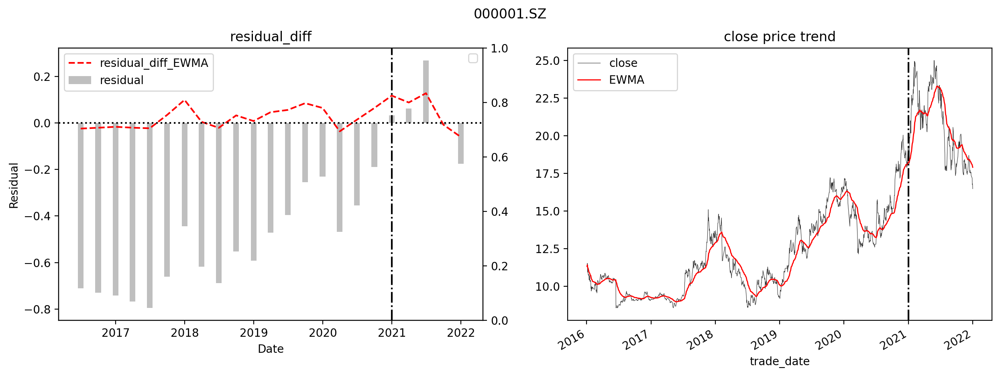

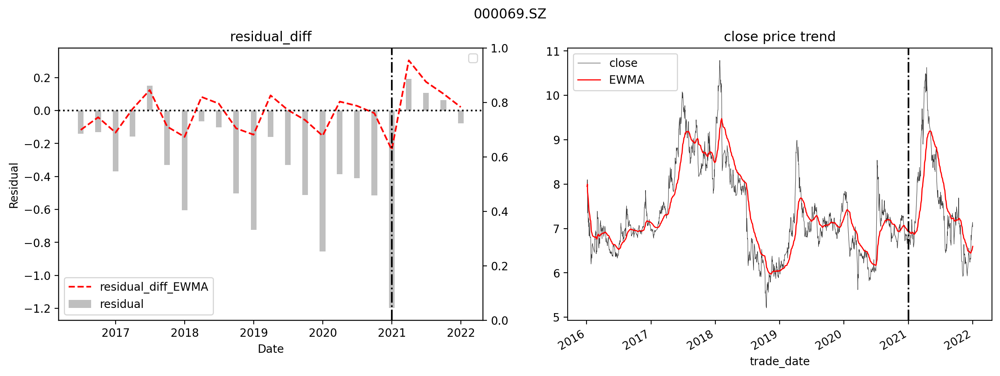

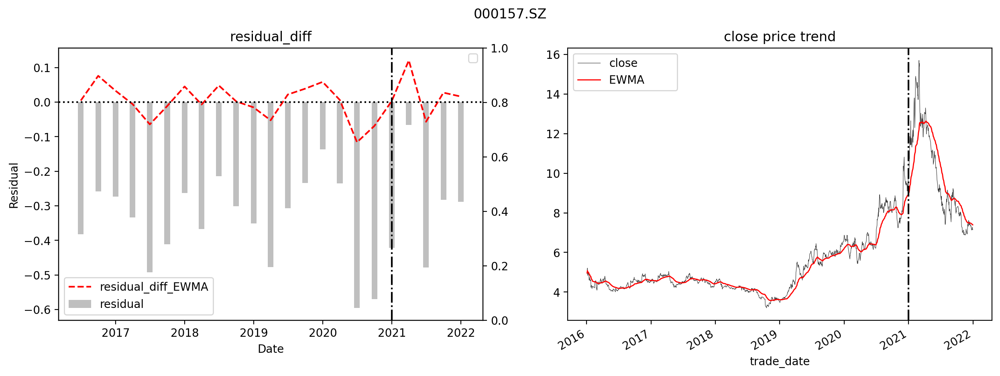

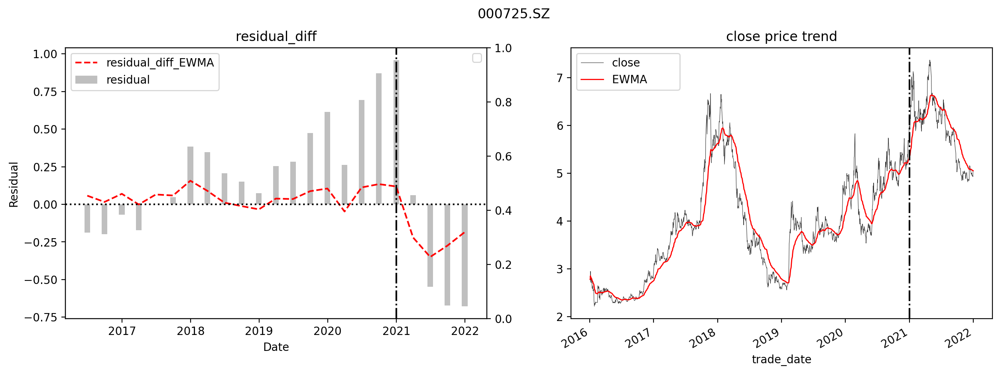

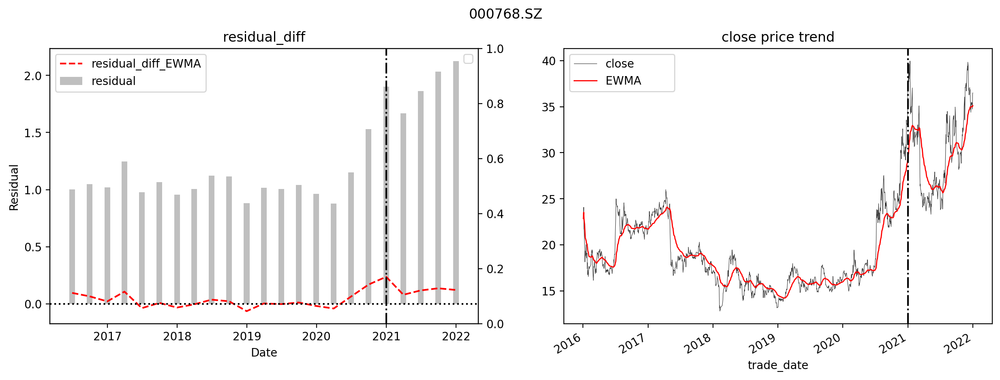

...

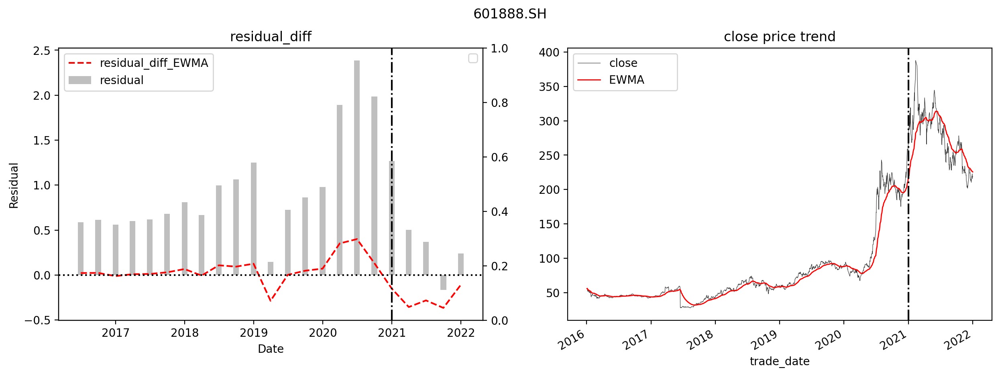

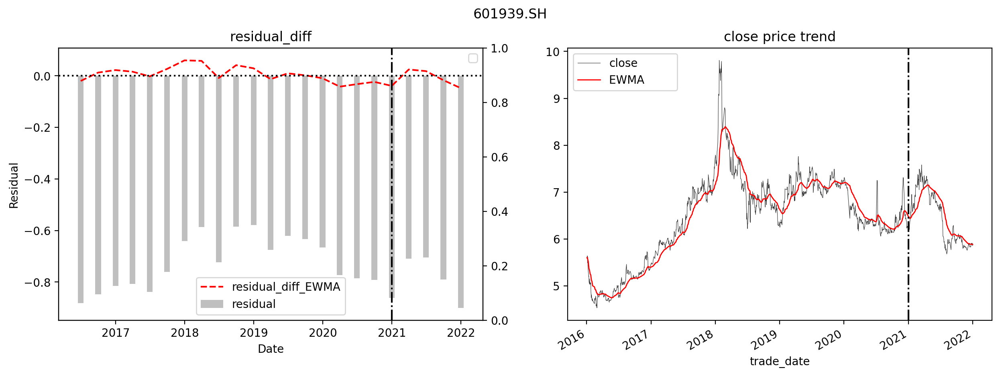

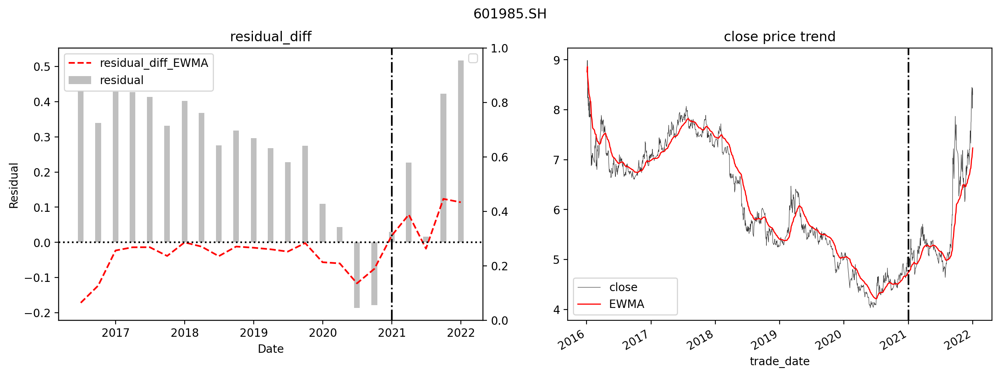

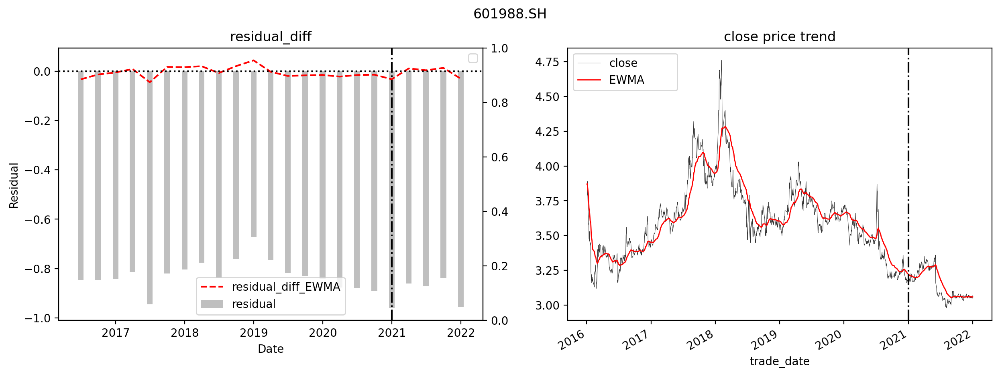

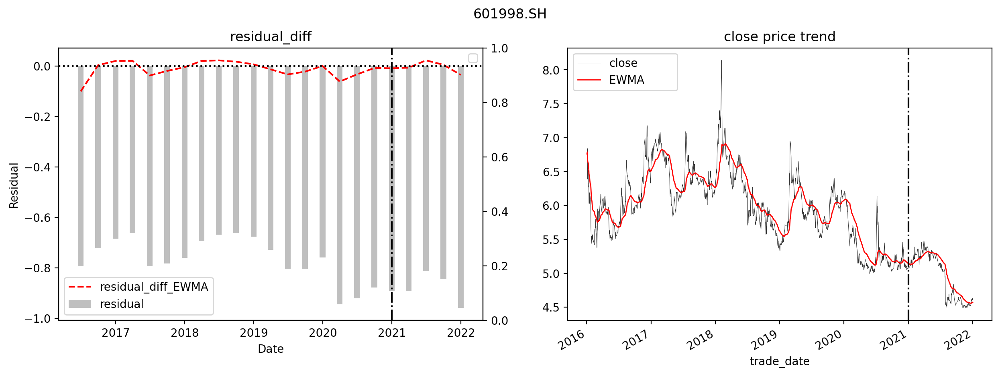

In [14]:

# 画图
for tic in stocks[:]:
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    # plot residual
    # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual', ax=ax[0], marker='.')
    # 画residual的柱状图
    
    ax_0 = ax[0].twinx()
    # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y=EMA_key, ax=ax_0, color='red', linestyle='--')
    # ax_0.axhline(y=0, color='black', linestyle=':')
    # # 画x在2021年的垂直线
    # ax_0.axvline(x=pd.Period('2021Q1', 'Q-DEC'), color='black', linestyle='dashdot')
    # ax[0].bar(merge3[merge3['ts_code'] == tic]['trade_date'], merge3[merge3['ts_code'] == tic]['residual'], width=10, color='grey', alpha=0.5,label='residual')
    # ax[0].bar(merge3[merge3['ts_code'] == tic]['trade_date'], merge3[merge3['ts_code'] == tic]['residual'], width=10, color='grey', label='residual')

    # # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual_diff', ax=ax[0], marker='.')
    # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y=EMA_key, ax=ax[0], color='red', linestyle='--')
    # ax[0].axhline(y=0, color='black', linestyle=':')
    # 画x在2021年的垂直线
    # ax[0].axvline(x=pd.Period('2021Q1', 'Q-DEC'), color='black', linestyle='dashdot')
    # ax[0].bar(merge3[merge3['ts_code'] == tic]['trade_date'], merge3[merge3['ts_code'] == tic]['residual'], width=10, color='grey', label='residual')
    
    
    # date range 'ts_code'] == tic
    date_range = pd.date_range(start='2016-06-30',end=' 2021-12-31',freq='Q')
    ax[0].plot(date_range, merge3[merge3['ts_code'] == tic][EMA_key], color='red', linestyle='--', label='residual_diff_EWMA')
    ax[0].bar(date_range, merge3[merge3['ts_code'] == tic]['residual'], width=30, color='grey', label='residual',alpha=0.5)
    ax[0].axvline(x=pd.Timestamp('2021-01-01 00:00:00'), color='black', linestyle='dashdot')
    ax[0].axhline(y=0, color='black', linestyle=':')
    ax[0].set_xlabel('Date')
    ax[0].set_ylabel('Residual')
    ax[0].set_title(tic)
    ax[0].legend()
    
    # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y=EMA_key, ax=ax_0, color='red', linestyle='--')

    # merge3[merge3['ts_code'] == tic].plot(x='trade_date', y='residual', ax=ax[0], kind='bar')

    plt.legend()

    # plot close price
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='close', ax=ax[1], linewidth=0.4, c=(0.2, 0.2, 0.2))
    stocks300_df.loc[stocks300_df['ts_code'] == tic, 'EWMA'] = stocks300_df[stocks300_df['ts_code'] == tic].close.ewm(span=50).mean().values
    stocks300_df[stocks300_df['ts_code'] == tic].plot(x='trade_date', y='EWMA',ax=ax[1], linewidth=1, c='red',label='EWMA        ')
    ax[1].axvline(x=pd.Timestamp('2021-01-01 00:00:00'), color='black', linestyle='dashdot')
    ax[0].set_title('residual_diff')
    ax[1].set_title('close price trend')
    plt.suptitle(tic)
    plt.show()
    plt.close()
    # plt.savefig('residual_diff/figure/' + tic + '.png')
    # plt.close()

In [83]:
len(merge3[merge3['ts_code'] == tic][EMA_key])

KeyError: 'residual_diff_EWMA6'

In [82]:
merge3[merge3['ts_code'] == tic]['trade_date']

0    2016-03-31
1    2016-06-30
2    2016-09-30
3    2016-12-31
4    2017-03-31
5    2017-06-30
6    2017-09-30
7    2017-12-31
8    2018-03-31
9    2018-06-30
10   2018-09-30
11   2018-12-31
12   2019-03-31
13   2019-06-30
14   2019-09-30
15   2019-12-31
16   2020-03-31
17   2020-06-30
18   2020-09-30
19   2020-12-31
20   2021-03-31
21   2021-06-30
22   2021-09-30
23   2021-12-31
Name: trade_date, dtype: datetime64[ns]

In [74]:
merge3[merge3['ts_code'] == tic]['trade_date']

2    2016-09-30
3    2016-12-31
4    2017-03-31
5    2017-06-30
6    2017-09-30
7    2017-12-31
8    2018-03-31
9    2018-06-30
10   2018-09-30
11   2018-12-31
12   2019-03-31
13   2019-06-30
14   2019-09-30
15   2019-12-31
16   2020-03-31
17   2020-06-30
18   2020-09-30
19   2020-12-31
20   2021-03-31
21   2021-06-30
22   2021-09-30
23   2021-12-31
Name: trade_date, dtype: datetime64[ns]

In [76]:
date_range = pd.date_range(start='2016-06-30',end=' 2021-12-31',freq='Q')
date_range

DatetimeIndex(['2016-06-30', '2016-09-30', '2016-12-31', '2017-03-31',
               '2017-06-30', '2017-09-30', '2017-12-31', '2018-03-31',
               '2018-06-30', '2018-09-30', '2018-12-31', '2019-03-31',
               '2019-06-30', '2019-09-30', '2019-12-31', '2020-03-31',
               '2020-06-30', '2020-09-30', '2020-12-31', '2021-03-31',
               '2021-06-30', '2021-09-30', '2021-12-31'],
              dtype='datetime64[ns]', freq='Q-DEC')

In [62]:
dates

DatetimeIndex(['2021-01-01', '2021-01-02', '2021-01-03', '2021-01-04',
               '2021-01-05', '2021-01-06', '2021-01-07', '2021-01-08',
               '2021-01-09', '2021-01-10'],
              dtype='datetime64[ns]', freq='D')

ValueError: Automatic legend placement (loc='best') not implemented for figure legend

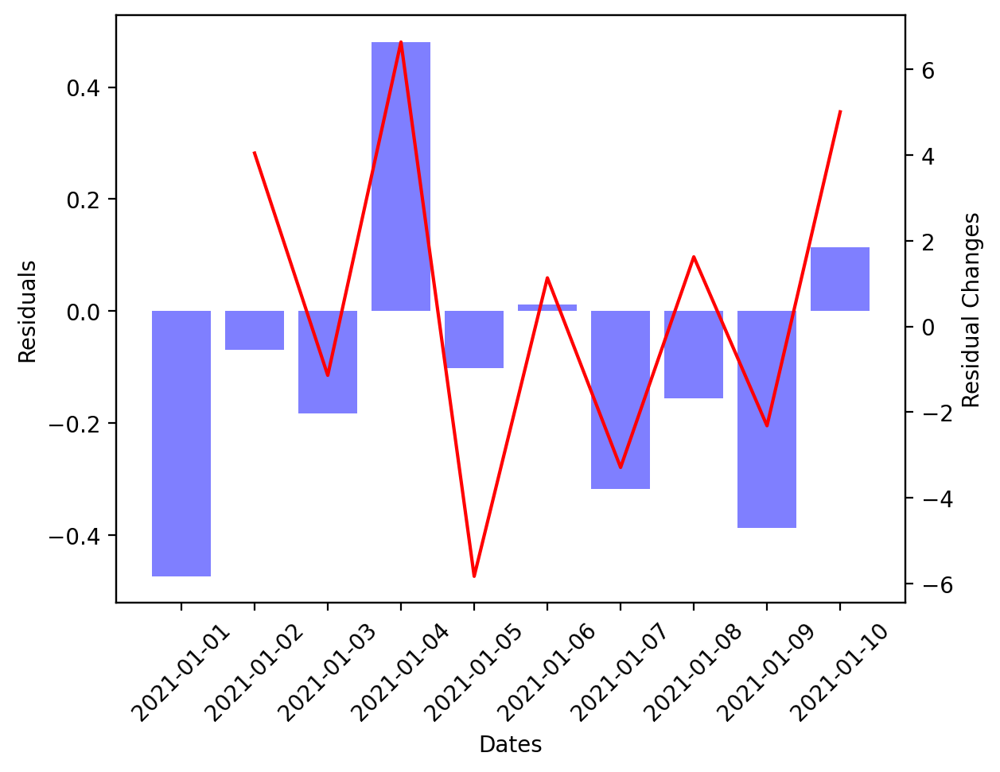

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 示例数据
dates = pd.date_range('20210101', periods=10)
residuals = np.random.rand(10) - 0.5
residual_changes = np.diff(residuals) * 10

# 创建 DataFrame
data = pd.DataFrame({'Dates': dates, 'Residuals': residuals})
data['Residual Changes'] = data['Residuals'].diff() * 10

fig, ax1 = plt.subplots()

# 绘制柱状图
ax1.bar(data['Dates'], data['Residuals'], color='b', alpha=0.5, label='Residuals')
ax1.set_xlabel('Dates')
ax1.set_ylabel('Residuals')
ax1.tick_params(axis='x', rotation=45)  # 旋转 x 轴刻度标签以提高可读性

# 创建一个共享 x 轴但具有不同 y 轴范围的新轴
ax2 = ax1.twinx()

# 绘制折线图
ax2.plot(data['Dates'][1:], data['Residual Changes'][1:], color='r', label='Residual Changes')
ax2.set_ylabel('Residual Changes')

# 添加图例
fig.legend(loc='best')

# 显示图形
plt.show()
